![king county image, from https://www.racialequityalliance.org/jurisdictions/king-county-washington/](https://www.racialequityalliance.org/wp-content/uploads/2016/10/assessors_social-1.jpg)


# King County Real Estate Prices

## Overview

A one-paragraph overview of the project, including the business problem, data, methods, results and recommendations.

## Business Problem

Summary of the business problem you are trying to solve, and the data questions that you plan to answer to solve them.

Questions to consider:

- Who are your stakeholders?
- What are your stakeholders' pain points related to this project?
- Why are your predictions important from a business perspective?


Amazon has awarded us a Grant for 60 million dollars to go towards affordable housing aquisitions in the King County Area.


In [1]:
#Imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from datetime import datetime

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate
from statsmodels.formula.api import ols
import statsmodels.api as sm
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
import sklearn.metrics as metrics
from random import gauss
from mpl_toolkits.mplot3d import Axes3D
from scipy import stats as stats
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import r2_score, mean_absolute_error
import utils 




## Data Understanding

Describe the data being used for this project.

Questions to consider:

- Where did the data come from, and how do they relate to the data analysis questions?
- What do the data represent? Who is in the sample and what variables are included?
- What is the target variable?
- What are the properties of the variables you intend to use?

In [2]:
#Reading in our data
df = pd.read_csv('../../data/kc_house_data.csv')

In [3]:
#Looking at column information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  object 
 9   view           21534 non-null  object 
 10  condition      21597 non-null  object 
 11  grade          21597 non-null  object 
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [4]:
#Checking int, float columns
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,17755.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,1788.596842,1970.999676,83.636778,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,827.759761,29.375234,399.946414,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,370.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,1190.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,1560.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,2210.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,9410.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [5]:
#Looking at null values
df.isna().sum()

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement       0
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64

- Null values found in waterfront, view, and yr_renovated.

### First Observations
 - In price, the max price is very significantly larger than the mean. We will look further into the column to evaluate outliers.
 - In bedrooms, there is a large max value indicating an outlier. We will remove later. This column may be treated as  categorical. 
 - In bathrooms, the max value is much higher than most of the dataset. This many bathrooms may be from a building that is not representative of the homes we would like to work with in our model. This column may be treated as categorical.
 - In sqft_living the max value is significantly larger than the mean. This large of a building may not be representative of the homes we would like to work with in our model.
 - In sqft_lot, the max value is significantly larger than a large portion of the dataset. This large of a lot may not be representative of the homes we would like to work with in our model. 
 - In floors, there is a max value that is larger than the majority of our dataset. We may restrict the number of floors in our model. 
 - In yr_built
 - In yr_renovated
 - In zipcode
 - In lat and Long
 - In sqft_living15
 - In sqft_lot15

In [6]:
#Explore object columns
obj_cols = [c for c in df.columns if df[c].dtype == 'object']
df[obj_cols].describe()

,date,waterfront,view,condition,grade,sqft_basement
count,21597,19221,21534,21597,21597,21597
unique,372,2,5,5,11,304
top,6/23/2014,NO,NONE,Average,7 Average,0.0
freq,142,19075,19422,14020,8974,12826


### First Observations

- Date column may need to be reformatted so that we can work with the values
- Waterfront has 11% null values and 88% of the values recorded are no. Only ~1% of the properties have waterfront access
- View has some null values and 90% have a value of none. 
- Condition is an ordinal feature with values of 1 - 5 
- Grade is an ordinal feature with values 3 - 13 
- sqft_basement is being treated as an object when it is an integer. 

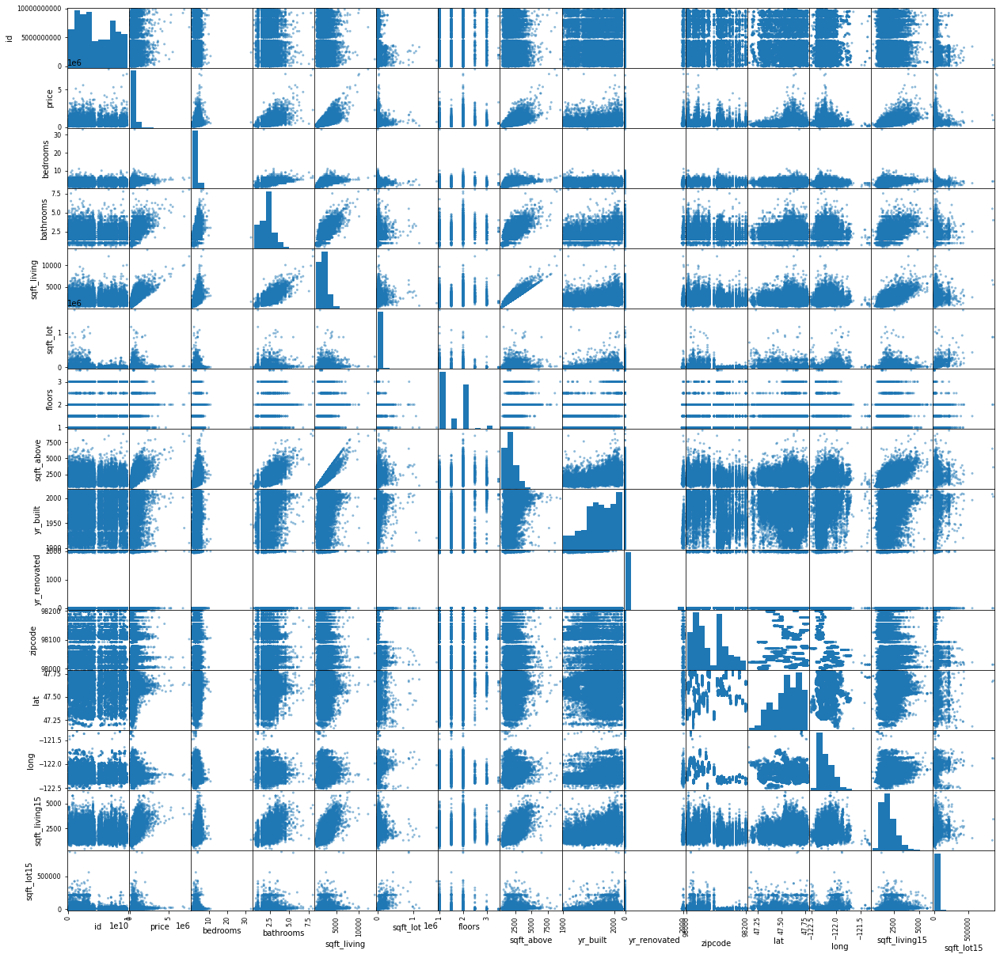

In [7]:
#Scatter matrix of all data to get a quick view of any obvious trends. 
pd.plotting.scatter_matrix(df, figsize = [21,21]);
plt.show()

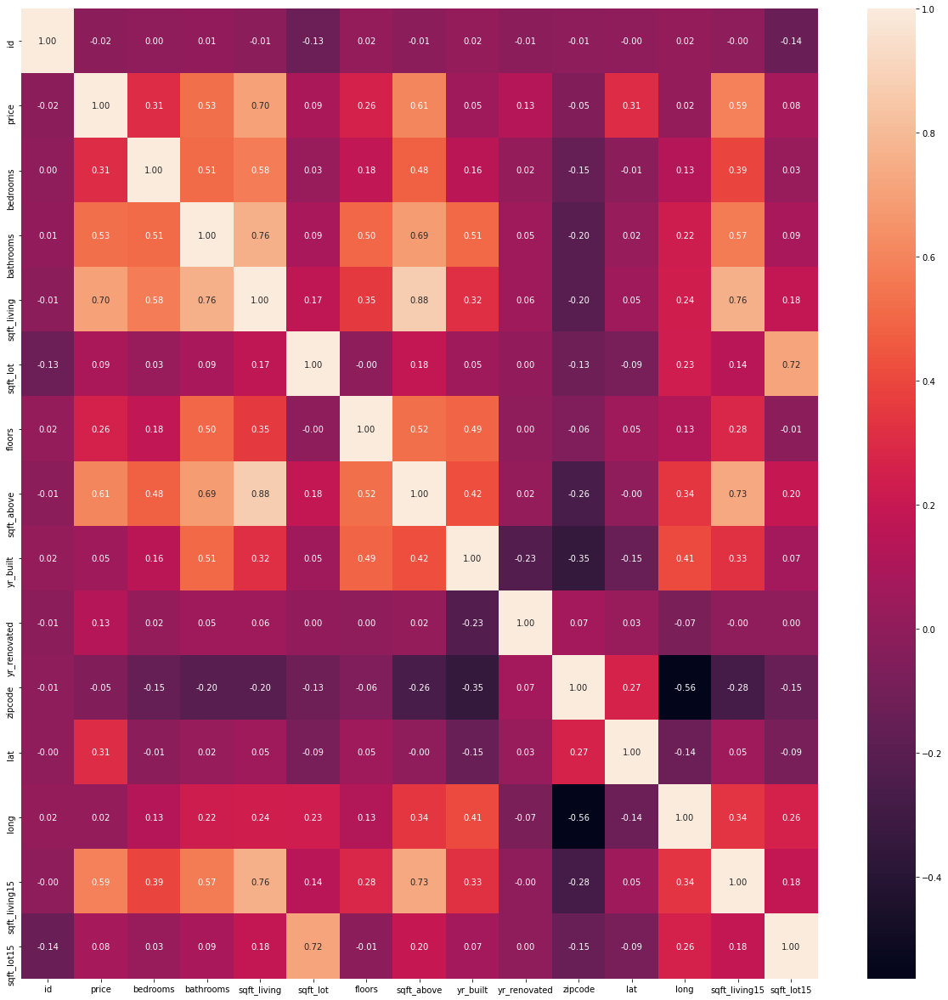

In [9]:
#Initial heatmap highlighing obvious correlations with Price
plt.figure(figsize = (21,21))
sns.heatmap(df.corr(), annot = True, fmt = '.2f');

- sqft_living shows the highest correlation with price 

In [68]:
# visualize Kings County real estate market

#graph mean price over zipcode

avg_price_zipcode = df.groupby("zipcode")["price"].mean().round(2)


print(avg_price_zipcode.head())

#avg_price_zipcode.plot(kind='bar',figsize=(20,10),title="Average Price by Zipcode", color="orange");
#fig,ax = plt.subplots()


df_zip_price = pd.DataFrame()

df_zip_price["zipcode"] = avg_price_zipcode.index
df_zip_price["mean_price"] = avg_price_zipcode.values

df_zip_price["zipcode"] = df_zip_price["zipcode"].astype(str)

print(type(df_zip_price["zipcode"]))

max_mean = df_zip_price["mean_price"].max()
#map the mean sales price data

import folium

map = folium.Map(location = [47.56,-122.26],default_zoom_start = .5)


map.choropleth(geo_data="../../data/kc_zipcodes.geojson",data = df_zip_price, columns = ['zipcode','mean_price'],key_on='feature.properties.ZIPCODE',fill_color= "YlOrBr", fill_opacity =0.6,line_opacity=0.2,legend_name = 'MEAN SALE PRICE',highlight=True,overlay=True,threshold_scale = [0,int((max_mean*.2)),int((max_mean/3)),int((max_mean/2)),int((max_mean*.65)),int((max_mean*.75)),int((max_mean*.9)),max_mean+1])

map

zipcode
98001     281194.87
98002     234284.04
98003     294111.28
98004    1356523.99
98005     810289.70
Name: price, dtype: float64
<class 'pandas.core.series.Series'>


In [70]:


sales_by_zipcode = df.groupby("zipcode")["zipcode"].value_counts()

print(sales_by_zipcode.head())
sale_count_list = sales_by_zipcode.values.tolist()

zipcodes_tuple = sales_by_zipcode.index.tolist()

zip_list = []

for zipcode in zipcodes_tuple:
    zip_list.append(zipcode[0])
    
print(zip_list)

df_sales_per_zip = pd.DataFrame()

df_sales_per_zip["zipcode"] = zip_list
df_sales_per_zip["zipcode"] = df_sales_per_zip["zipcode"].astype(str)
#sales_over_zipcode.plot(kind='bar',figsize = (20,10), title= "Total Sales Per Zipcode")

df_sales_per_zip["sales"] = sale_count_list


print(df_sales_per_zip.head())

map = folium.Map(location = [47.56,-122.26],default_zoom_start = .5)


map.choropleth(geo_data="../../data/kc_zipcodes.geojson",data = df_sales_per_zip, columns = ['zipcode','sales'],key_on='feature.properties.ZIPCODE',fill_color= "YlGnBu", fill_opacity =0.5,line_opacity=0.2,legend_name = 'SALES BY ZIPCODE',line_color="orange")

map

zipcode  zipcode
98001    98001      361
98002    98002      199
98003    98003      280
98004    98004      317
98005    98005      168
Name: zipcode, dtype: int64
[98001, 98002, 98003, 98004, 98005, 98006, 98007, 98008, 98010, 98011, 98014, 98019, 98022, 98023, 98024, 98027, 98028, 98029, 98030, 98031, 98032, 98033, 98034, 98038, 98039, 98040, 98042, 98045, 98052, 98053, 98055, 98056, 98058, 98059, 98065, 98070, 98072, 98074, 98075, 98077, 98092, 98102, 98103, 98105, 98106, 98107, 98108, 98109, 98112, 98115, 98116, 98117, 98118, 98119, 98122, 98125, 98126, 98133, 98136, 98144, 98146, 98148, 98155, 98166, 98168, 98177, 98178, 98188, 98198, 98199]
  zipcode  sales
0   98001    361
1   98002    199
2   98003    280
3   98004    317
4   98005    168


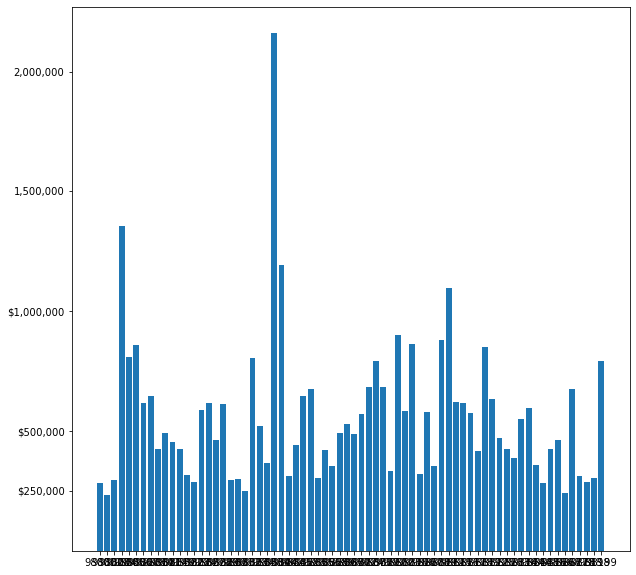

In [101]:
fig, ax = plt.subplots(figsize=(10,10))

ax.bar(df_zip_price["zipcode"],df_zip_price["mean_price"])
ax.set_yticks([250000,500000,1000000,1500000,2000000])
ax.set_yticklabels(['$250,000','$500,000','$1,000,000','1,500,000','2,000,000']);
ax

## Data Preparation

Describe and justify the process for preparing the data for analysis.

Questions to consider:

- Were there variables you dropped or created?
- How did you address missing values or outliers?
- Why are these choices appropriate given the data and the business problem?

In [10]:
#Creating unique dataframe with restricted values
df_limited  = df

In [11]:
#There are ? values in sq_ft basement, causing it to be categorized as an object. Removing those values.
#Initial analysis showed the sqft basement is the sqft living space minus the sqft above space.
df_limited['sqft_basement'] = df_limited['sqft_living'] - df_limited['sqft_above']


In [12]:
#Dropping Id, waterfront, View, yr_renovated. 
#Id won't be very useful for our analysis. 
#Waterfront properties only represent ~1% of the properties in the dataset and are not significant for our model.
#90% of the values in view are none. The remaining values aren't significant enough to remain in our model.
#97% of vales in yr_renovated are either null or 0.0
df_limited = df.drop(columns = ['id', 'waterfront', 'view', 'yr_renovated'])

In [13]:
#Turning the grade column into a numerical column
grade_df = df_limited[["grade"]]

for i in range(len(grade_df)):
    grade_df.at[i,"grade"] = grade_df.at[i,"grade"][:2]
    grade_df.at[i,"grade"].strip()
    grade_df.at[i,"grade"] = int(grade_df.at[i,"grade"])

grade_df.rename(columns = {'grade': 'num_grade'}, inplace = True)

df_limited = pd.concat([grade_df, df_limited], axis=1)

In [14]:
df_limited['num_grade'] = df_limited['num_grade'].astype(str).astype(int)

In [15]:
#Turning object date into a datetime64 and isolating month
df_limited['date'] = pd.to_datetime(df_limited['date'])


In [16]:
df_limited['month_date'] = df_limited['date'].dt.strftime('%m')

In [17]:
df_limited['month_date'] = df_limited['month_date'].astype(str).astype(int)

In [18]:
#Restricting bedroom number to exclude outliers and be more representative of single family homes.
df_limited = df_limited[(df_limited['bedrooms'] < 6) & (df_limited['bedrooms'] > 1)]

In [19]:
#Restricting bathroom number to exclude outliers and be more representative of single family homes.
df_limited = df_limited[df_limited['bathrooms'] < 5]

In [20]:
#Restricting floor number to exclude outliers and be more representative of single family homes.
df_limited = df_limited[df_limited['floors'] <= 3]

In [21]:
#Restricting price to train our model on realistic home prices
df_limited = df_limited[df_limited['price'] < 2000000]

In [22]:
#Restricting the square foot living space 
df_limited = df_limited[df_limited['sqft_living'] < 6000]

In [23]:
#restricting the square foot lot space
df_limited = df_limited[df_limited['sqft_lot'] < 10000]

In [24]:
#restricting basement size
df_limited = df_limited[df_limited['sqft_basement'] < 2000]

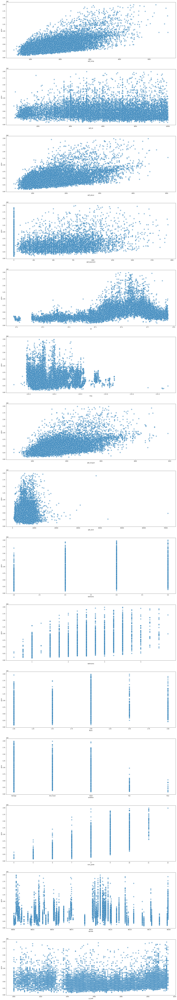

In [25]:
features = [
     "sqft_living", "sqft_lot", "sqft_above", "sqft_basement", "lat", "long",
    "sqft_living15", "sqft_lot15", "bedrooms", "bathrooms", "floors", 
     "condition", "num_grade", "zipcode", "yr_built"
    
]


fig = plt.figure(figsize=(25, len(features)*10))
for i, col in enumerate(features):
    ax = fig.add_subplot(len(features), 1, i + 1)
    if col in features:
        sns.scatterplot(x=col, y="price", data=df_limited, ax=ax, alpha=0.5, s=100)

## Modeling

Describe and justify the process for analyzing or modeling the data.

Questions to consider:

- How did you analyze the data to arrive at an initial approach?
- How did you iterate on your initial approach to make it better?
- Why are these choices appropriate given the data and the business problem?

In [28]:
#Setting our X and Y for our train test split. 
X = df_limited.drop(columns = 'price')
y = df_limited['price']

In [29]:
#Performing train test split using test size of 25%
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = .25, random_state = 42)

In [30]:
print("X Train:")
display(X_train.describe())
print("X Test:")
display(X_test.describe())

X Train:


,num_grade,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,month_date
count,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000,11233.000000
mean,7.476809,3.278554,2.040795,1891.894774,6031.819104,1.521855,1635.504763,256.390012,1970.553459,98085.667141,47.564210,-122.238645,1835.441200,6257.088489,6.575625
std,0.973482,0.801275,0.710936,719.450946,2380.532067,0.557093,672.652455,381.416136,31.707717,52.819915,0.135868,0.129943,570.832913,2674.102634,3.119247
min,4.000000,2.000000,0.500000,440.000000,520.000000,1.000000,440.000000,0.000000,1900.000000,98001.000000,47.189600,-122.512000,460.000000,659.000000,1.000000
25%,7.000000,3.000000,1.500000,1360.000000,4377.000000,1.000000,1140.000000,0.000000,1948.000000,98034.000000,47.484200,-122.344000,1430.000000,4500.000000,4.000000
50%,7.000000,3.000000,2.000000,1780.000000,6200.000000,1.500000,1460.000000,0.000000,1973.000000,98103.000000,47.575900,-122.283000,1720.000000,6242.000000,6.000000
75%,8.000000,4.000000,2.500000,2320.000000,7927.000000,2.000000,1990.000000,500.000000,2001.000000,98122.000000,47.680100,-122.164000,2140.000000,8000.000000,9.000000
max,11.000000,5.000000,4.750000,5635.000000,9998.000000,3.000000,5040.000000,1950.000000,2015.000000,98199.000000,47.777600,-121.364000,4950.000000,70973.000000,12.000000


X Test:


,num_grade,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,yr_built,zipcode,lat,long,sqft_living15,sqft_lot15,month_date
count,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000,3745.000000
mean,7.493725,3.270761,2.036916,1902.271295,6037.448598,1.522830,1646.069159,256.202136,1969.549533,98085.457944,47.563931,-122.237308,1848.052336,6236.612283,6.591722
std,0.983858,0.797875,0.712274,745.403261,2343.272736,0.552964,691.067008,383.929052,32.320151,52.739319,0.134163,0.131552,584.873112,2531.349863,3.122018
min,4.000000,2.000000,0.750000,540.000000,600.000000,1.000000,480.000000,0.000000,1900.000000,98001.000000,47.189600,-122.456000,690.000000,651.000000,1.000000
25%,7.000000,3.000000,1.500000,1350.000000,4498.000000,1.000000,1140.000000,0.000000,1947.000000,98038.000000,47.486400,-122.344000,1430.000000,4560.000000,4.000000
50%,7.000000,3.000000,2.000000,1780.000000,6181.000000,1.500000,1460.000000,0.000000,1971.000000,98103.000000,47.576600,-122.282000,1720.000000,6231.000000,6.000000
75%,8.000000,4.000000,2.500000,2330.000000,7923.000000,2.000000,2020.000000,500.000000,2001.000000,98119.000000,47.678700,-122.162000,2160.000000,8000.000000,9.000000
max,12.000000,5.000000,4.750000,5120.000000,9999.000000,3.000000,4500.000000,1910.000000,2015.000000,98199.000000,47.777100,-121.319000,4560.000000,30950.000000,12.000000


In [31]:
train_df = pd.concat([X_train, y_train], axis = 1)


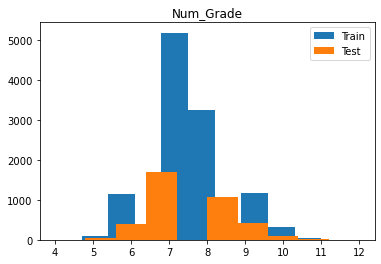

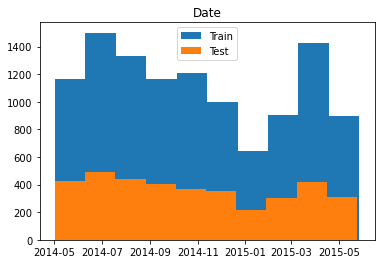

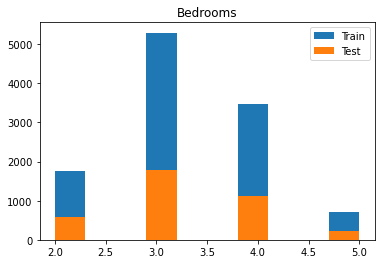

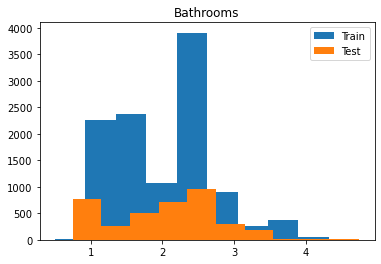

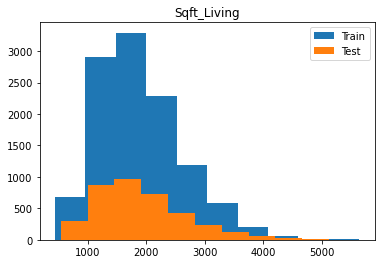

...

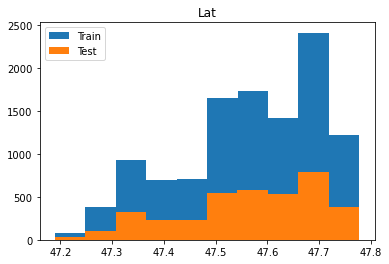

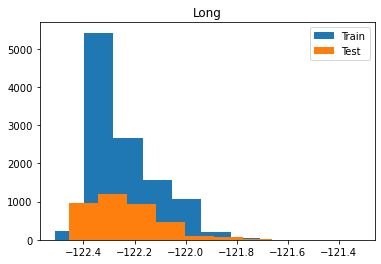

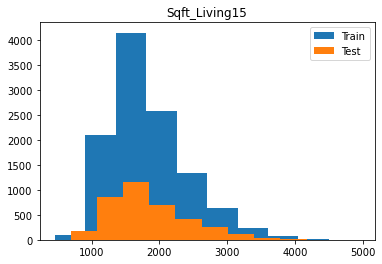

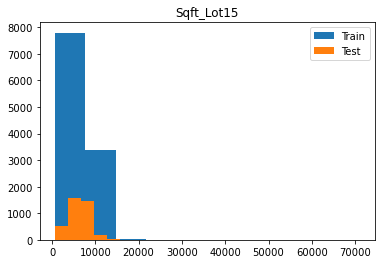

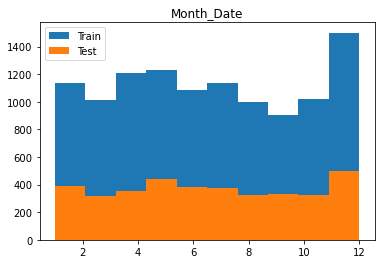

In [32]:
used_cols = [c for c in df_limited.columns if c not in ['price']]

for col in used_cols:
    plt.hist(X_train[col], label = 'Train')
    plt.hist(X_test[col], label = 'Test')
    plt.title(f"{col.title()}")
    plt.legend()
    plt.show()

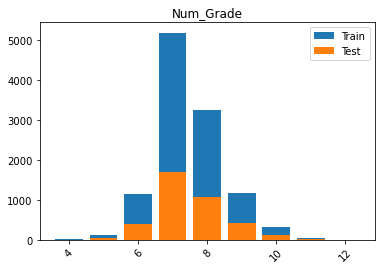

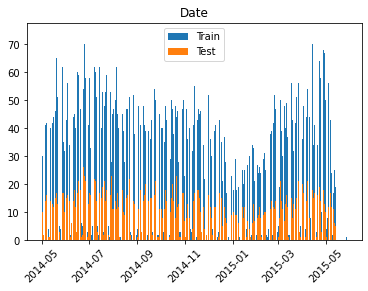

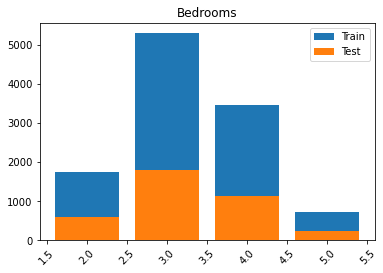

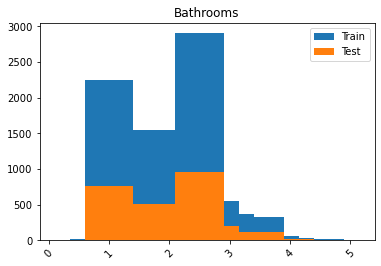

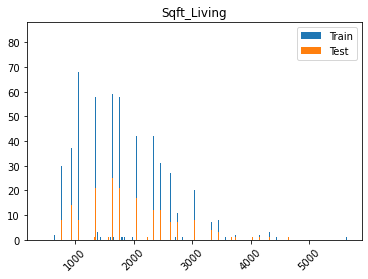

...

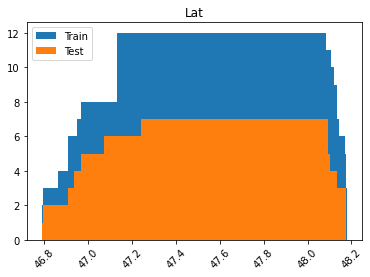

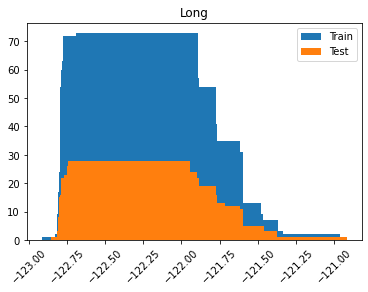

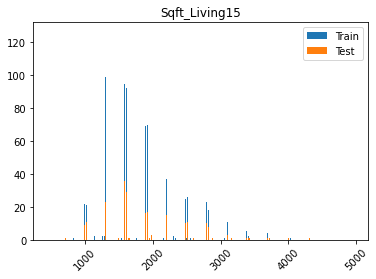

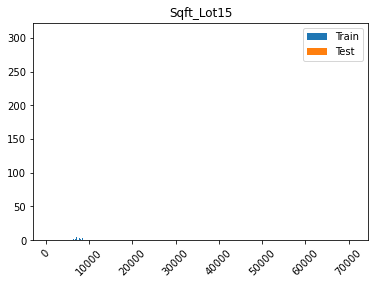

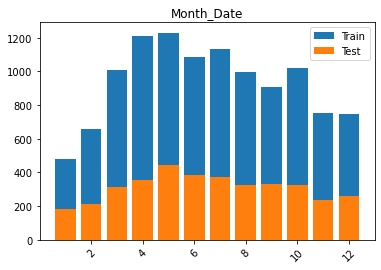

In [33]:
for col in used_cols:
    train_values = X_train[col].value_counts()
    test_values = X_test[col].value_counts()
    plt.bar(train_values.index, train_values, label = 'Train')
    plt.bar(test_values.index, test_values, label = 'Test')
    plt.title(f"{col.title()}")
    plt.xticks(rotation = 45)
    plt.legend()
    plt.show()

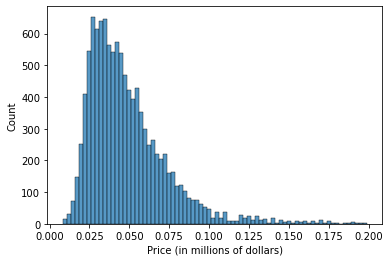

In [34]:
sns.histplot(y_train/10000000)
plt.xlabel("Price (in millions of dollars)");

<AxesSubplot:>

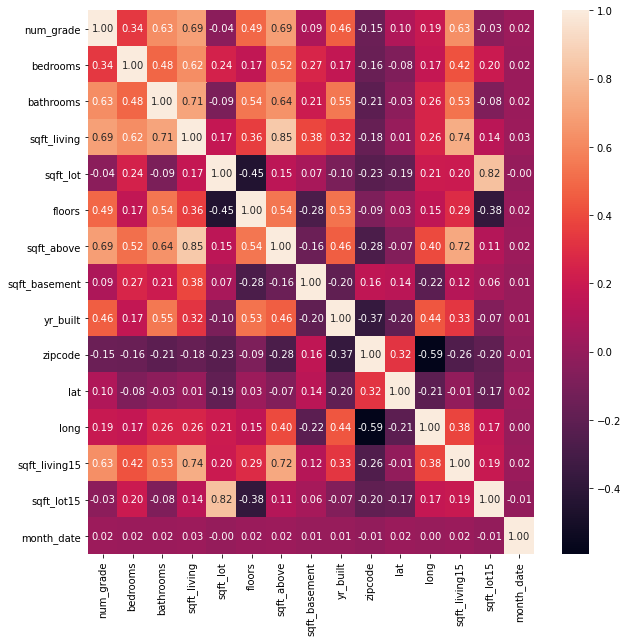

In [35]:
plt.figure(figsize = (10,10))
sns.heatmap(X_train.corr(), annot = True, fmt = '.2f')

<AxesSubplot:>

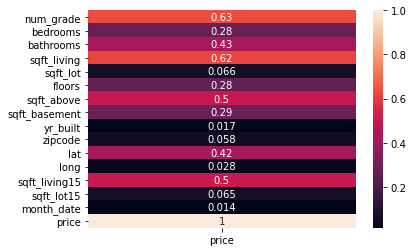

In [36]:
sns.heatmap(abs(train_df.corr())[['price']], annot = True)

In [37]:
train_target_mean = y_train.mean()
train_target_mean

485144.6841449301

In [38]:
baseline_train_preds = [train_target_mean] * len(y_train)
baseline_test_preds = [train_target_mean] * len(y_test)

In [39]:
print(f"Train R2: {r2_score(y_train, baseline_train_preds)}")
print(f"Test R2: {r2_score(y_test, baseline_test_preds)}")
print('****')
print(f"Train RMSE: {mean_squared_error(y_train, baseline_train_preds, squared = False)}")
print(f"Test RMSE: {mean_squared_error(y_test, baseline_test_preds, squared = False)}") 



Train R2: 0.0
Test R2: -0.000801449053849268
****
Train RMSE: 249627.7288447142
Test RMSE: 256214.39931304308


In [40]:
fsm_X_train = X_train['sqft_living']
fsm_X_test = X_test['sqft_living']

In [41]:
ssm_X_train = X_train['sqft_living15']
ssm_X_test = X_test['sqft_living15']

In [42]:
ssm = sm.OLS(y_train, sm.add_constant(ssm_X_train)).fit()


In [43]:
ssm_train_preds = ssm.predict(sm.add_constant(ssm_X_train))
ssm_test_preds = ssm.predict(sm.add_constant(ssm_X_test))

In [44]:
ssm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.253
Method:                 Least Squares   F-statistic:                     3799.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        21:09:14   Log-Likelihood:            -1.5390e+05
No. Observations:               11233   AIC:                         3.078e+05
Df Residuals:                   11231   BIC:                         3.078e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          8.161e+04   6856.736     11.902      0.000    6.82e+04    9.51e+04
sqft_living15   219.8569      3.567     61.633      0.000     212.865     226.849
==============================================================================
Omnibus:                     3683.989   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            14966.686
Skew:                           1.584   Prob(JB):                         0.00
Kurtosis:                       7.685   Cond. No.                     6.47e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.47e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [45]:
fsm = sm.OLS(y_train, sm.add_constant(fsm_X_train)).fit()


In [46]:
fsm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.383
Model:                            OLS   Adj. R-squared:                  0.382
Method:                 Least Squares   F-statistic:                     6958.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        21:09:14   Log-Likelihood:            -1.5283e+05
No. Observations:               11233   AIC:                         3.057e+05
Df Residuals:                   11231   BIC:                         3.057e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        7.912e+04   5207.475     15.194      0.000    6.89e+04    8.93e+04
sqft_living   214.6121      2.573     83.416      0.000     209.569     219.655
==============================================================================
Omnibus:                     2550.484   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7571.953
Skew:                           1.178   Prob(JB):                         0.00
Kurtosis:                       6.260   Cond. No.                     5.69e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.69e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [47]:
fsm_train_preds = fsm.predict(sm.add_constant(fsm_X_train))
fsm_test_preds = fsm.predict(sm.add_constant(fsm_X_test))

In [48]:
print(f"Train R2: {r2_score(y_train, fsm_train_preds)}")
print(f"Test R2: {r2_score(y_test, fsm_test_preds)}")
print('****')
print(f"Train RMSE: {mean_squared_error(y_train, fsm_train_preds, squared = False)}")
print(f"Test RMSE: {mean_squared_error(y_test, fsm_test_preds, squared = False)}") 


Train R2: 0.382548310640356
Test R2: 0.3798476717622069
****
Train RMSE: 196152.71200816112
Test RMSE: 201687.39658260052


In [50]:
def evaluate(y_tr, tr_preds, y_te, te_preds):
    """
    Evaluate the amount of error between my model's predictions and the actual values for both a train and a test set.
    
    Inputs:
    y_train - array like, actual vales for 'price' for my train dataset
    train_preds - array like, predicted values for 'price' for my train dataset
    y_teast - array like, actual vales for 'price' for my train dataset
    test_preds - array like, predicted values for 'price' for my train dataset
    
    Outputs:
    
    """
    
    
    print(f"Train R2: {r2_score(y_tr, tr_preds):.4f}")
    print(f"Test R2: {r2_score(y_te, te_preds):.4f}")
    print('****')
    print(f"Train RMSE: ${mean_squared_error(y_tr, tr_preds, squared = False):,.2f}")
    print(f"Test RMSE: ${mean_squared_error(y_te, te_preds, squared = False):,.2f}") 
    print('****')
    print(f"Train MAE: ${mean_absolute_error(y_tr, tr_preds):,.2f}")
    print(f"Test MAE: ${mean_absolute_error(y_te, te_preds):,.2f}")
    
    #calculate our residiuals
    
    train_residuals = y_tr - tr_preds
    test_residuals = y_te - te_preds
    #Scatter plot
    plt.scatter(tr_preds,train_residuals, label = "Train")
    plt.scatter(te_preds, test_residuals, label = "Test")
    
    plt.axhline(y = 0, color = 'red', label = '0')
    plt.xlabel('predictions')
    plt.ylabel('residuals')
    plt.legend()
    plt.show()

Train R2: 0.3825
Test R2: 0.3798
****
Train RMSE: $196,152.71
Test RMSE: $201,687.40
****
Train MAE: $147,085.55
Test MAE: $151,060.17


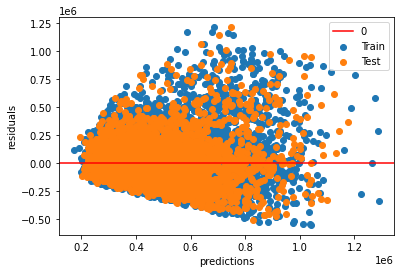

In [51]:
evaluate(y_train, fsm_train_preds, y_test, fsm_test_preds)

Train R2: 0.2527
Test R2: 0.2562
****
Train RMSE: $215,788.71
Test RMSE: $220,885.56
****
Train MAE: $157,145.97
Test MAE: $159,886.09


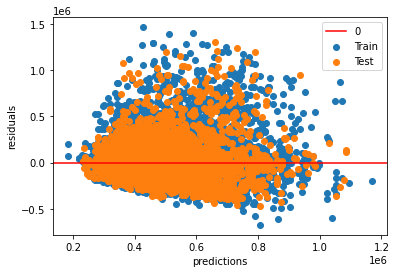

In [52]:
evaluate(y_train, ssm_train_preds, y_test, ssm_test_preds)

In [53]:
used_cols = [c for c in X_train.columns if c not in [*obj_cols]]

In [60]:
#model = sm.OLS(y_train, sm.add_constant(X_train['sqft_living'])).fit()

In [61]:
model = sm.OLS(y_train, sm.add_constant(X_train[used_cols])).fit()

In [62]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.692
Method:                 Least Squares   F-statistic:                     1801.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        21:35:03   Log-Likelihood:            -1.4892e+05
No. Observations:               11233   AIC:                         2.979e+05
Df Residuals:                   11218   BIC:                         2.980e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -7.463e+06   2.85e+06     -2.621      0.009    -1.3e+07   -1.88e+06
num_grade      1.043e+05   2205.210     47.316      0.000       1e+05    1.09e+05
bedrooms      -2.259e+04   2181.408    -10.356      0.000   -2.69e+04   -1.83e+04
bathrooms      2.847e+04   3242.939      8.778      0.000    2.21e+04    3.48e+04
sqft_living     132.6879      4.883     27.174      0.000     123.117     142.259
sqft_lot         -6.7006      1.082     -6.192      0.000      -8.822      -4.580
floors         1.387e+04   4065.510      3.411      0.001    5898.528    2.18e+04
sqft_above       -0.5661      4.978     -0.114      0.909     -10.323       9.191
yr_built      -2777.7138     60.754    -45.720      0.000   -2896.803   -2658.624
zipcode        -245.3682     32.472     -7.556      0.000    -309.018    -181.718
lat            5.467e+05   1.07e+04     51.300      0.000    5.26e+05    5.68e+05
long           -8.55e+04   1.41e+04     -6.081      0.000   -1.13e+05   -5.79e+04
sqft_living15    36.1159      3.778      9.559      0.000      28.710      43.522
sqft_lot15       -1.1286      0.862     -1.309      0.191      -2.819       0.562
month_date    -3190.2329    419.609     -7.603      0.000   -4012.739   -2367.727
==============================================================================
Omnibus:                     3748.727   Durbin-Watson:                   1.972
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23803.082
Skew:                           1.454   Prob(JB):                         0.00
Kurtosis:                       9.512   Cond. No.                     2.15e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.15e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [63]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.692
Model:                            OLS   Adj. R-squared:                  0.692
Method:                 Least Squares   F-statistic:                     1801.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        21:35:14   Log-Likelihood:            -1.4892e+05
No. Observations:               11233   AIC:                         2.979e+05
Df Residuals:                   11218   BIC:                         2.980e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const         -7.463e+06   2.85e+06     -2.621      0.009    -1.3e+07   -1.88e+06
num_grade      1.043e+05   2205.210     47.316      0.000       1e+05    1.09e+05
bedrooms      -2.259e+04   2181.408    -10.356      0.000   -2.69e+04   -1.83e+04
bathrooms      2.847e+04   3242.939      8.778      0.000    2.21e+04    3.48e+04
sqft_living     132.6879      4.883     27.174      0.000     123.117     142.259
sqft_lot         -6.7006      1.082     -6.192      0.000      -8.822      -4.580
floors         1.387e+04   4065.510      3.411      0.001    5898.528    2.18e+04
sqft_above       -0.5661      4.978     -0.114      0.909     -10.323       9.191
yr_built      -2777.7138     60.754    -45.720      0.000   -2896.803   -2658.624
zipcode        -245.3682     32.472     -7.556      0.000    -309.018    -181.718
lat            5.467e+05   1.07e+04     51.300      0.000    5.26e+05    5.68e+05
long           -8.55e+04   1.41e+04     -6.081      0.000   -1.13e+05   -5.79e+04
sqft_living15    36.1159      3.778      9.559      0.000      28.710      43.522
sqft_lot15       -1.1286      0.862     -1.309      0.191      -2.819       0.562
month_date    -3190.2329    419.609     -7.603      0.000   -4012.739   -2367.727
==============================================================================
Omnibus:                     3748.727   Durbin-Watson:                   1.972
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            23803.082
Skew:                           1.454   Prob(JB):                         0.00
Kurtosis:                       9.512   Cond. No.                     2.15e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.15e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Train R2: 0.6921
Test R2: 0.6820
****
Train RMSE: $138,518.37
Test RMSE: $144,423.56
****
Train MAE: $97,967.04
Test MAE: $101,765.87


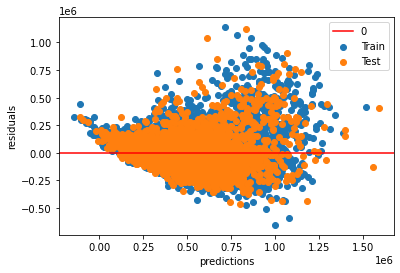

In [64]:
train_preds = model.predict(sm.add_constant(X_train[used_cols]))
test_preds = model.predict(sm.add_constant(X_test[used_cols]))
evaluate(y_train, train_preds, y_test, test_preds)

In [65]:
scaler = StandardScaler()

scaler.fit(X_train[used_cols])




StandardScaler()

In [66]:
X_train_scaled = scaler.transform(X_train[used_cols])
X_test_scaled = scaler.transform(X_test[used_cols])

In [67]:
model = 

SyntaxError: invalid syntax (<ipython-input-67-4e03f794e53f>, line 1)

## Evaluation

The evaluation of each model should accompany the creation of each model, and you should be sure to evaluate your models consistently.

Evaluate how well your work solves the stated business problem. 

Questions to consider:

- How do you interpret the results?
- How well does your model fit your data? How much better is this than your baseline model? Is it over or under fit?
- How well does your model/data fit any modeling assumptions?

For the final model, you might also consider:

- How confident are you that your results would generalize beyond the data you have?
- How confident are you that this model would benefit the business if put into use?

### Baseline Understanding

- What does a baseline, model-less prediction look like?

In [ ]:
# code here to arrive at a baseline prediction

### First Model

Before going too far down the data preparation rabbit hole, be sure to check your work against a first 'substandard' model! What is the easiest way for you to find out how hard your problem is?

In [71]:
#Our first model using the feature with highest correlation to price
simple_formula = 'price ~ sqft_living + bedrooms + bathrooms + sqft_living15'
date_mod = ols(formula = simple_formula, data = df_limited).fit()
date_mod_summ = date_mod.summary()

date_mod_summ

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.402
Model:                            OLS   Adj. R-squared:                  0.402
Method:                 Least Squares   F-statistic:                     2521.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        21:50:05   Log-Likelihood:            -2.0364e+05
No. Observations:               14978   AIC:                         4.073e+05
Df Residuals:                   14973   BIC:                         4.073e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept      1.533e+05   7689.167     19.942      0.000    1.38e+05    1.68e+05
sqft_living     225.4880      4.292     52.534      0.000     217.075     233.901
bedrooms      -5.088e+04   2551.508    -19.941      0.000   -5.59e+04   -4.59e+04
bathrooms      1227.4201   3199.539      0.384      0.701   -5044.068    7498.908
sqft_living15    38.4257      4.134      9.296      0.000      30.323      46.528
==============================================================================
Omnibus:                     3263.117   Durbin-Watson:                   1.990
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             9301.100
Skew:                           1.147   Prob(JB):                         0.00
Kurtosis:                       6.105   Cond. No.                     1.38e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [72]:
trains_preds_log = model.predict(sm.add_constant(X_train_scaled))

In [76]:
y_train_log = np.log(y_train)
y_test_log = np.log(y_test)

In [77]:
model = sm.OLS(y_train_log, sm.add_constant(X_train_scaled)).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.750
Model:                            OLS   Adj. R-squared:                  0.749
Method:                 Least Squares   F-statistic:                     2399.
Date:                Wed, 06 Oct 2021   Prob (F-statistic):               0.00
Time:                        21:50:42   Log-Likelihood:                 347.67
No. Observations:               11233   AIC:                            -665.3
Df Residuals:                   11218   BIC:                            -555.4
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.9795      0.002   5859.972      0.000      12.975      12.984
x1             0.1744      0.004     47.973      0.000       0.167       0.182
x2            -0.0126      0.003     -4.266      0.000      -0.018      -0.007
x3             0.0431      0.004     11.029      0.000       0.035       0.051
x4             0.1548      0.006     26.028      0.000       0.143       0.167
x5            -0.0400      0.004     -9.165      0.000      -0.049      -0.031
x6             0.0092      0.004      2.397      0.017       0.002       0.017
x7            -0.0078      0.006     -1.369      0.171      -0.019       0.003
x8            -0.1457      0.003    -44.647      0.000      -0.152      -0.139
x9            -0.0287      0.003     -9.889      0.000      -0.034      -0.023
x10            0.1926      0.002     78.562      0.000       0.188       0.197
x11           -0.0073      0.003     -2.347      0.019      -0.013      -0.001
x12            0.0563      0.004     15.408      0.000       0.049       0.063
x13           -0.0213      0.004     -5.459      0.000      -0.029      -0.014
x14           -0.0182      0.002     -8.214      0.000      -0.023      -0.014
==============================================================================
Omnibus:                      262.650   Durbin-Watson:                   1.982
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              561.010
Skew:                          -0.108   Prob(JB):                    1.51e-122
Kurtosis:                       4.073   Cond. No.                         7.95
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [78]:
train_preds_log = model.predict(sm.add_constant(X_train_scaled))
test_preds_log = model.predict(sm.add_constant(X_test_scaled))

In [79]:
train_preds_unlog = np.exp(train_preds_log)
test_preds_unlog = np.exp(test_preds_log)

Train R2: 0.6921
Test R2: 0.6820
****
Train RMSE: $138,518.37
Test RMSE: $144,423.56
****
Train MAE: $97,967.04
Test MAE: $101,765.87


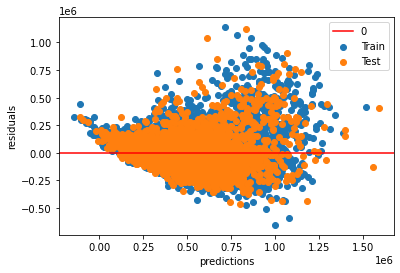

In [80]:
evaluate(y_train, train_preds, y_test, test_preds)

Train R2: 0.7496
Test R2: 0.7386
****
Train RMSE: $0.23
Test RMSE: $0.24
****
Train MAE: $0.18
Test MAE: $0.19


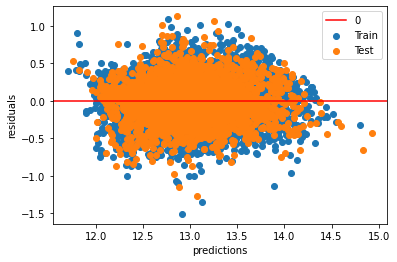

In [81]:
evaluate(y_train_log, train_preds_log, y_test_log, test_preds_log)

In [82]:
print(mean_squared_error(y_train, train_preds_unlog, squared = False))
print(mean_squared_error(y_test, test_preds_unlog, squared = False))

134037.00665330418
143311.2967874355


In [83]:
print(mean_absolute_error(y_train, train_preds_unlog))
print(mean_absolute_error(y_test, test_preds_unlog))

89471.26399206204
94019.1745050142


In [ ]:
# code here to evaluate your first 'substandard' model

### Modeling Iterations

Now you can start to use the results of your first model to iterate - there are many options!

In [ ]:
# code here to iteratively improve your models

In [ ]:
# code here to evaluate your iterations

### 'Final' Model

In the end, you'll arrive at a 'final' model - aka the one you'll use to make your recommendations/conclusions. This likely blends any group work. It might not be the one with the highest scores, but instead might be considered 'final' or 'best' for other reasons.

In [ ]:
# code here to show your final model

In [ ]:
# code here to evaluate your final model

## Conclusions

Provide your conclusions about the work you've done, including any limitations or next steps.

Questions to consider:

- What would you recommend the business do as a result of this work?
- What are some reasons why your analysis might not fully solve the business problem?
- What else could you do in the future to improve this project (future work)?
